# Ahşap Anomali Tespiti

Bu notebook, `data_preprocessing.py` scriptindeki adımları interaktif bir şekilde uygular.

**Adımlar:**
1. Gerekli kütüphaneleri ve yolları tanımlama
2. Veri setini bir Pandas DataFrame'e yükleme
3. Görüntü önişleme fonksiyonlarını tanımlama
4. Örnek bir görüntü üzerinde önişleme adımlarını test etme ve görselleştirme
5. Tüm veri setini işleyip yeni bir klasöre kaydetme

In [5]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.notebook import tqdm
import shutil
from skimage import exposure
import json

# Deep Learning Kütüphaneleri
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.datasets as datasets

# tqdm'un pandas ile entegrasyonu için
tqdm.pandas()

## 1. Dataset Yollarını Tanımlama

Orijinal veri setinin ve önişlenmiş verilerin kaydedileceği klasör yollarını belirliyoruz.

In [6]:
# Çalıştığın ortama göre
ENVIRONMENT = "local" # "local"

In [7]:
if ENVIRONMENT == "colab":
    from google.colab import drive
    drive.mount('/content/drive')
    DRIVE_PATH = "/content/drive/MyDrive/Kod/machine_learning/"
    PROJECT_ROOT = os.path.join(DRIVE_PATH, "Kod")
    DATASET_ROOT = os.path.join(DRIVE_PATH, "dataset")
else:
    # PROJECT_ROOT = os.path.join(os.path.dirname(os.path.abspath(__file__)), "..")
    PROJECT_ROOT = os.getcwd()
    DATASET_ROOT = os.path.join(PROJECT_ROOT, "dataset")

# Orijinal olan veriler
ORIGINAL_DATA = os.path.join(DATASET_ROOT, "wood")


In [8]:
# SELECTED_DATASET = os.path.join(DATASET_ROOT, "wood_otsu_clahe")
# TRAIN_GOOD_PATH = os.path.join(SELECTED_DATASET, "train", "good")
# TEST_GOOD_PATH = os.path.join(SELECTED_DATASET, "test", "good")
# TEST_DEFECT_PATH = os.path.join(SELECTED_DATASET, "test", "defect")

# print(f"Orijinal Dataset Path: {SELECTED_DATASET}")
# print(f"Kullanılacak Dataset Path: {SELECTED_DATASET}")

In [9]:
# Orijinal olan veriler
DATASET_ROOT = os.path.join(PROJECT_ROOT, "dataset")
ORIGINAL_DATA = os.path.join(PROJECT_ROOT, "dataset", "wood")
TRAIN_GOOD_PATH = os.path.join(ORIGINAL_DATA, "train", "good")
TEST_GOOD_PATH = os.path.join(ORIGINAL_DATA, "test", "good")
TEST_DEFECT_PATH = os.path.join(ORIGINAL_DATA, "test", "defect")

# preprocess yapıldıktan sonra kaydedeceğimiz yer
PREPROCESSED_ROOT = os.path.join(PROJECT_ROOT, "dataset", "wood_preprocessed_notebook")

print(f"Orijinal Dataset Kök Dizini: {ORIGINAL_DATA}")
print(f"Önişlenmiş Veri Kök Dizini: {PREPROCESSED_ROOT}")

Orijinal Dataset Kök Dizini: c:\Users\Yasin\Desktop\Kodlar\OGU\machine_learning\dataset\wood
Önişlenmiş Veri Kök Dizini: c:\Users\Yasin\Desktop\Kodlar\OGU\machine_learning\dataset\wood_preprocessed_notebook


## 2. Veriyi DataFrame Olarak Yükleme

Tüm görüntülerin yollarını, etiketlerini (`good`/`defect`) ve setlerini (`train`/`test`) içeren bir Pandas DataFrame oluşturalım. Bu, veri üzerinde çalışmayı kolaylaştırır.

In [10]:
def create_dataset_df(root_path):
    """Veri seti yollarını tarayarak bir DataFrame oluşturur."""
    image_paths = []

    # Path objesi ile tüm .bmp dosyalarını bul
    for path in Path(root_path).rglob('*.bmp'):
        parts = path.parts
        # Klasör yapısına göre etiketleri ve setleri çıkar
        # dataset/wood/test/defect/image.bmp -> ('...','test','defect','image.bmp')
        dataset_type = parts[-3]  # train veya test
        label = parts[-2]         # good veya defect
        filename = parts[-1]      # dosya adı

        image_paths.append({
            'filepath': str(path),
            'type': dataset_type,
            'label': label,
            'filename': filename
        })

    return pd.DataFrame(image_paths)

# DataFrame'i oluşturalım
df = create_dataset_df(ORIGINAL_DATA)

print("DataFrame başarıyla oluşturuldu!")
print(f"Toplam görüntü sayısı: {len(df)}")

# DataFrame'in ilk 5 satırını ve bilgilerini göster
display(df.head())
print("\nDataFrame Bilgileri:")
df.info()

DataFrame başarıyla oluşturuldu!
Toplam görüntü sayısı: 136


,filepath,type,label,filename
0,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075252...
1,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075252...
2,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075356...
3,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075356...
4,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075942...



DataFrame Bilgileri:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136 entries, 0 to 135
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filepath  136 non-null    object
 1   type      136 non-null    object
 2   label     136 non-null    object
 3   filename  136 non-null    object
dtypes: object(4)
memory usage: 4.4+ KB


In [11]:
df

,filepath,type,label,filename
0,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075252...
1,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075252...
2,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075356...
3,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075356...
4,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,test,defect,Basler_r2L4096-14gc__40653549__20251009_075942...
...,...,...,...,...
131,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,train,good,Basler_r2L4096-14gc__40653549__20251009_075942...
132,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,train,good,Basler_r2L4096-14gc__40653549__20251009_075942...
133,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,train,good,Basler_r2L4096-14gc__40653549__20251009_075942...
134,c:\Users\Yasin\Desktop\Kodlar\OGU\machine_lear...,train,good,Basler_r2L4096-14gc__40653549__20251009_075942...


## 3. Görüntü Önişleme Sınıfı ve Fonksiyonları

`data_preprocessing.py` scriptindeki `ImagePreprocessor` sınıfını buraya taşıyoruz. Bu sınıf, tüm önişleme mantığını içerir.

`show_side_by_side` fonksiyonu, görüntüleri yan yana görselleştirmek için kullanılır.

In [12]:
def show_side_by_side(images, titles=None, figsize=(18, 6)):
    """
    Birden fazla resmi yan yana gösterir.
    Args:
        images (list): Görseller listesi (RGB veya gri)
        titles (list): Başlık listesi (opsiyonel)
        figsize (tuple): (genişlik, yükseklik)
    """
    n = len(images)
    titles = titles or [""] * n

    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles), start=1):
        plt.subplot(1, n, i)
        if img.ndim == 2:
            plt.imshow(img, cmap="gray")
        else:
            plt.imshow(img)
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

In [ ]:
class ImagePreprocessor:
    """Görüntü önişleme sınıfı"""

    def __init__(self, target_size=(256, 256), apply_crop=True):
        self.target_size = target_size
        self.apply_crop = apply_crop

    def load_image(self, image_path):
        image = cv2.imread(str(image_path))
        if image is not None:
            return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return None

    def crop_with_canny(self, image, threshold=10):
        """Crops borders using Canny edge detection."""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), 50, 150)
        coords = np.column_stack(np.where(edges > 0))
        if len(coords) > 0:
            y_min, x_min = coords.min(axis=0)
            y_max, x_max = coords.max(axis=0)
            return image[y_min:y_max, x_min:x_max]
        return image

    def crop_with_otsu(self, image):
        """Crops the image using Otsu's thresholding to find the main object."""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        # Gürültüyü azaltmak için blur uygulama
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)

        # Otsu's thresholding (THRESH_BINARY_INV yerine THRESH_BINARY kullanarak)
        # Bu, ahşabın arka plandan daha açık renkli olduğu varsayımına dayanır.
        _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Find contours
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            return image # Return original if no contours found

        # Find the largest contour
        largest_contour = max(contours, key=cv2.contourArea)

        # Get bounding box
        x, y, w, h = cv2.boundingRect(largest_contour)

        # Add a small margin
        margin = 10
        h_img, w_img = image.shape[:2]
        x_start = max(0, x - margin)
        y_start = max(0, y - margin)
        x_end = min(w_img, x + w + margin)
        y_end = min(h_img, y + h + margin)

        return image[y_start:y_end, x_start:x_end]

    def apply_gabor(self, image, ksize=(31, 31), sigma=5.0, theta=np.pi/4, lambd=10.0, gamma=0.5):
        """Applies a Gabor filter to highlight texture."""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        kernel = cv2.getGaborKernel(ksize, sigma, theta, lambd, gamma, 0, ktype=cv2.CV_32F)
        gabor_response = cv2.filter2D(gray, cv2.CV_8U, kernel)
        return cv2.cvtColor(gabor_response, cv2.COLOR_GRAY2RGB)

    def denoise(self, image, method='bilateral'):
        if method == 'bilateral':
            return cv2.bilateralFilter(image, 9, 75, 75)
        elif method == 'gaussian':
            return cv2.GaussianBlur(image, (5, 5), 0)
        elif method == 'median':
            return cv2.medianBlur(image, 5)
        elif method == 'nlm':
            return cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
        return image

    def enhance_contrast(self, image, method='clahe'):
        if method == 'clahe':
            lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
            l, a, b = cv2.split(lab)
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            l_clahe = clahe.apply(l)
            enhanced_lab = cv2.merge([l_clahe, a, b])
            return cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2RGB)
        elif method == 'histogram_eq':
            ycrcb = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
            ycrcb[:, :, 0] = cv2.equalizeHist(ycrcb[:, :, 0])
            return cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2RGB)
        elif method == 'adaptive':
            return exposure.equalize_adapthist(image, clip_limit=0.03)
        return image

    def sharpen(self, image, strength=1.0):
        kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]) * strength
        return cv2.filter2D(image, -1, kernel)

    def normalize_image(self, image, method='minmax'):
        image_float = image.astype(np.float32)
        if method == 'minmax':
            normalized = (image_float - image_float.min()) / (image_float.max() - image_float.min() + 1e-8)
        elif method == 'zscore':
            mean = image_float.mean()
            std = image_float.std() + 1e-8
            normalized = (image_float - mean) / std
            normalized = (normalized - normalized.min()) / (normalized.max() - normalized.min() + 1e-8)
        elif method == 'robust':
            p2, p98 = np.percentile(image_float, (2, 98))
            normalized = np.clip((image_float - p2) / (p98 - p2 + 1e-8), 0, 1)
        return (normalized * 255).astype(np.uint8)

    def resize_image(self, image, target_size=None):
        if target_size is None:
            target_size = self.target_size
        return cv2.resize(image, target_size, interpolation=cv2.INTER_LANCZOS4)

    def white_balance(self, image):
        """Gray-world white balance ile renk dengesini düzelt."""
        result = image.copy().astype(np.float32)
        avg_b, avg_g, avg_r = [np.mean(result[:, :, i]) for i in range(3)]
        avg_gray = (avg_b + avg_g + avg_r) / 3
        for i, avg in enumerate([avg_b, avg_g, avg_r]):
            result[:, :, i] *= avg_gray / avg
        return np.clip(result, 0, 255).astype(np.uint8)

    def adjust_gamma(self, image, gamma=1.5):
        """Gamma düzeltmesi (parlaklık ayarı)."""
        invGamma = 1.0 / gamma
        table = np.array([(i / 255.0) ** invGamma * 255 for i in range(256)]).astype("uint8")
        return cv2.LUT(image, table)

    def apply_log_filter(self, image, ksize=1):
        """Laplacian of Gaussian (LoG) filtresi ile kenar vurgulama."""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        blurred = cv2.GaussianBlur(gray, (ksize, ksize), 0)
        log = cv2.Laplacian(blurred, cv2.CV_64F)
        log = cv2.convertScaleAbs(log)
        return cv2.cvtColor(log, cv2.COLOR_GRAY2RGB)

    def apply_sobel(self, image):
        """Sobel filtresiyle kenar ve doku yönlerini çıkar."""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        gx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        sobel = cv2.magnitude(gx, gy)
        sobel = cv2.convertScaleAbs(sobel)
        return cv2.cvtColor(sobel, cv2.COLOR_GRAY2RGB)

    def high_boost_filter(self, image, boost_factor=1.5):
        """High-boost filtresi (keskinlik ve doku vurgusu)."""
        blur = cv2.GaussianBlur(image, (5, 5), 0)
        high_freq = cv2.addWeighted(image, 1 + boost_factor, blur, -boost_factor, 0)
        return np.clip(high_freq, 0, 255).astype(np.uint8)

    def hsv_v_enhance(self, image):
        """HSV uzayında sadece parlaklık (V) kanalını eşitle."""
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv)
        v_eq = cv2.equalizeHist(v)
        hsv_eq = cv2.merge((h, s, v_eq))
        return cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2RGB)

    def edge_preserving(self, image):
        """Kenar koruyucu filtre (Bilateral benzeri ama daha doğal)."""
        return cv2.edgePreservingFilter(image, flags=1, sigma_s=60, sigma_r=0.4)

    def to_grayscale(self, image):
        """Renkli görüntüyü siyah-beyaz (grayscale) forma çevir."""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        return cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

    def to_lab_lightness(self, image):
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        L, A, B = cv2.split(lab)
        L_norm = cv2.normalize(L, None, 0, 255, cv2.NORM_MINMAX)
        return cv2.cvtColor(L_norm, cv2.COLOR_GRAY2RGB)

    def to_ycbcr_luma(self, image):
        ycbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        Y, Cr, Cb = cv2.split(ycbcr)
        return cv2.cvtColor(Y, cv2.COLOR_GRAY2RGB)

    def preprocess_pipeline(self, image, config=None):
        """
        Görüntü önişleme hattı (pipeline)
        config sözlüğü ile hangi adımların uygulanacağı belirlenir.
        """
        default_config = {
            'crop_method': None,      # 'canny', 'otsu', or None
            'denoise': None,          # 'bilateral', 'gaussian', 'median', 'nlm', or None
            'contrast': None,         # 'clahe', 'histogram_eq', 'adaptive', or None
            'sharpen': False,         # True / False
            'sharpen_strength': 0.5,
            'normalize': None,        # 'minmax', 'zscore', 'robust', or None
            'resize': True,            # True / False
            # Ek filtreler:
            'white_balance': False,
            'gamma': None,             # float (ör. 1.2, 1.5)
            'apply_log': False,
            'apply_sobel': False,
            'high_boost': False,
            'edge_preserving': False
        }

        if config is None:
            config = default_config
        else:
            default_config.update(config)
            config = default_config

        processed = image.copy()

        #  Kırpma
        crop_method = config.get('crop_method')
        if crop_method == 'canny':
            processed = self.crop_with_canny(processed)
        elif crop_method == 'otsu':
            processed = self.crop_with_otsu(processed)

        #  White balance
        if config.get('white_balance', False):
            processed = self.white_balance(processed)

        #  Gamma correction
        if config.get('gamma'):
            processed = self.adjust_gamma(processed, gamma=config['gamma'])

        #  Gürültü azaltma
        if config.get('denoise'):
            processed = self.denoise(processed, method=config['denoise'])

        #  Kontrast artırma
        if config.get('contrast'):
            processed = self.enhance_contrast(processed, method=config['contrast'])

        #  LoG filtresi
        if config.get('apply_log', False):
            processed = self.apply_log_filter(processed)

        #  Sobel filtresi
        if config.get('apply_sobel', False):
            processed = self.apply_sobel(processed)

        #  High-boost filtresi
        if config.get('high_boost', False):
            processed = self.high_boost_filter(processed)

        #  Edge-preserving filtresi
        if config.get('edge_preserving', False):
            processed = self.edge_preserving(processed)

        # Keskinleştirme (opsiyonel)
        if config.get('sharpen', False):
            strength = config.get('sharpen_strength', 0.5)
            processed = self.sharpen(processed, strength=strength)

        # Normalizasyon (opsiyonel)
        if config.get('normalize'):
            processed = self.normalize_image(processed, method=config['normalize'])

        # Yeniden boyutlandırma
        if config.get('resize', True):
            processed = self.resize_image(processed)

        return processed

print("ImagePreprocessor sınıfı, Gabor filtresi ile güncellendi.")

ImagePreprocessor sınıfı, Gabor filtresi ile güncellendi.


Preprocessor nesnesi oluşturalım ve defect örneklerden rastgele bir örnek seçerek işlemleri uygulayalım.

In [14]:
# Preprocessor'ı oluşturalım
preprocessor = ImagePreprocessor(target_size=(256, 256))

## 4. Örnek Görüntü Üzerinde Test ve Görselleştirme

Bir örnek görüntü seçip, "Balanced" (dengeli) konfigürasyon ile önişleme adımlarını uygulayalım ve sonucu görelim.

Test için seçilen görüntü: /content/drive/MyDrive/Makale-Döküman-Makale Çalışmaları/YL Dersler/Makine Öğrenimi ve Anomali Tespiti/Kod/dataset/wood/test/defect/Basler_r2L4096-14gc__40653549__20251009_075942256_0065.bmp


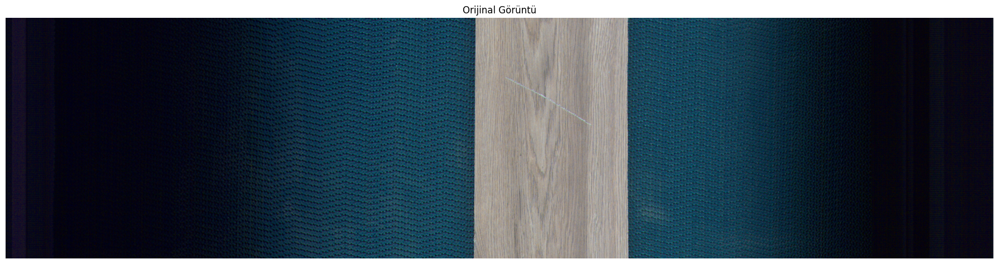

In [ ]:
# # Örnek bir görüntü seçelim (test setinden)
# sample_candidates = df[(df['type'] == 'test') & (df['label'] == 'defect')]
# sample_row = sample_candidates.sample(1).iloc[0]
# sample_path = sample_row['filepath']

# print(f"Test için seçilen görüntü: {sample_path}")

# # Görüntüyü yükle
# original_image = preprocessor.load_image(sample_path)
# show_side_by_side(
#     [original_image],
#     ["Orijinal Görüntü"]
# )

Tüm önişlemlerimizi uygulayabileceğimiz bir pipeline kullanabiliriz. Bunun için class içerisindeki `preprocess_pipeline` fonksiyonunu   kullanabiliriz. Bu fonksiyona dict tipinde config tanımı vererek işlemleri gerçekleştirebiliriz.

config'lerimizi belirtelim ve pipeline fonksiyonunu çağıralım.

örn :

```python
config_dictionary = {
    'crop_method': 'otsu',          # Otsu kırpma aktif
    'denoise': 'bilateral',         # Gürültü azaltma
    'contrast': 'clahe',            # Kontrast iyileştirme
    'sharpen': True,                # Keskinleştirme aktif
    'sharpen_strength': 0.6,        # Güç miktarı
    'normalize': 'minmax',          # [0,1] aralığına normalizasyon
    'resize': True                  # Yeniden boyutlandırma
}
processed_image = preprocessor.preprocess_pipeline(original_image, config_dictionary)
```

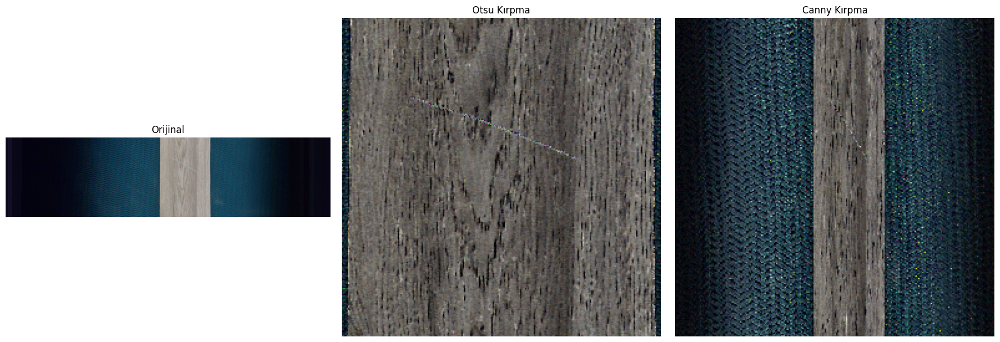

In [ ]:
# # Önişleme pipeline'ını Otsu kırpma ile uygula
# otsu_config = {
#     'crop_method': 'otsu',          # Otsu kırpma aktif
#     'denoise': 'bilateral',         # Gürültü azaltma
#     'contrast': 'clahe',            # Kontrast iyileştirme
#     'sharpen': True,                # Keskinleştirme aktif
#     'sharpen_strength': 0.6,        # Güç miktarı
#     'normalize': 'minmax',          # [0,1] aralığına normalizasyon
#     'resize': True                  # Yeniden boyutlandırma
# }
# canny_config = {
#     'crop_method': 'canny',          # Canny kırpma aktif
#     'denoise': 'bilateral',         # Gürültü azaltma
#     'contrast': 'clahe',            # Kontrast iyileştirme
#     'sharpen': True,                # Keskinleştirme aktif
#     'sharpen_strength': 0.6,        # Güç miktarı
#     'normalize': 'minmax',          # [0,1] aralığına normalizasyon
#     'resize': True                  # Yeniden boyutlandırma
# }
# processed_image_otsu = preprocessor.preprocess_pipeline(original_image, config=otsu_config)
# processed_image_canny = preprocessor.preprocess_pipeline(original_image, config=canny_config)


# show_side_by_side(
#     [original_image, processed_image_otsu, processed_image_canny],
#     ["Orijinal", "Otsu Kırpma", "Canny Kırpma"],
#     figsize=(18,6)
# )




Hangi adımların uygulanacağını seçmeden önce tek tek önişlemleri karşılaştırabiliriz. Bu adımda farklı filtre ve kesme uygulamalarını birbiri ile karşılaştırabiliriz

In [ ]:
# """ Doğrudan fonksiyonları kullanarak bazı önişlemler uygulayalım ve sonuçları karşılaştıralım. """
# otsu_image = preprocessor.crop_with_otsu(original_image)
# enhanced_image = preprocessor.enhance_contrast(otsu_image, method="clahe")
# sharpened_image = preprocessor.sharpen(enhanced_image)
# resized_image = preprocessor.resize_image(sharpened_image)

# show_side_by_side(
#     [original_image, otsu_image, enhanced_image, sharpened_image, resized_image],
#     ["Orijinal", "Kırpılmış (Otsu)", "CLAHE", "Keskinleştirilmiş", "Yeniden Boyutlandırılmış"],
#     figsize=(22,6)
# )


Output hidden; open in https://colab.research.google.com to view.

### 4.1. Görüntü İyileştirme Tekniklerinin Karşılaştırılması (CLAHE vs. Gabor)

Bu bölümde, farklı görüntü iyileştirme tekniklerinin etkilerini görsel olarak karşılaştıracağız. Özellikle, kontrastı artıran **CLAHE** ve doku özelliklerini vurgulayan **Gabor filtresi** arasındaki farkları inceleyeceğiz.


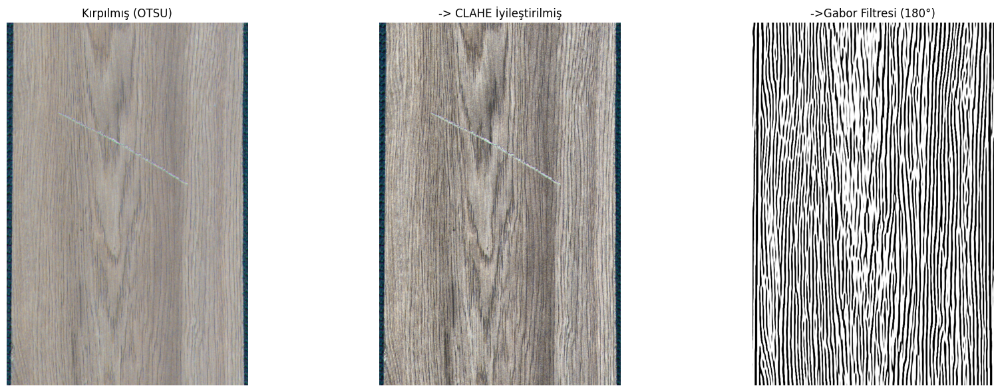

In [ ]:
# # Örnek bir görüntü üzerinde iyileştirme tekniklerini test edelim
# # Preprocessor'ı yeniden oluşturmaya gerek yok, yukarıdaki hücrede zaten var.
# # sample_path da bir önceki hücreden geliyor.

# # CLAHE uygula
# clahe_image = preprocessor.enhance_contrast(otsu_image.copy(), method='clahe')

# # Gabor filtresi uygula
# gabor_image_2 = preprocessor.apply_gabor(otsu_image.copy(), theta=np.pi)   # 180 derece

# show_side_by_side(
#     [otsu_image, clahe_image, gabor_image_2],
#     ["Kırpılmış (OTSU)", "-> CLAHE İyileştirilmiş", "->Gabor Filtresi (180°)"],
#     figsize=(18,6)
# )

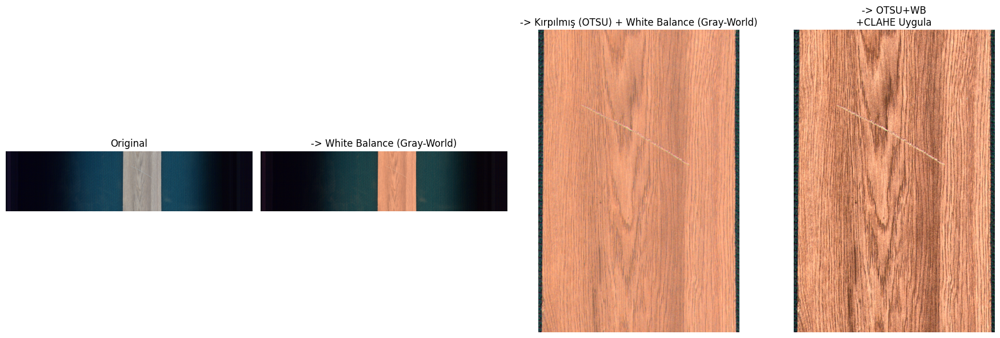

In [ ]:
# wb_img = preprocessor.white_balance(original_image)
# wb_otsu_image = preprocessor.crop_with_otsu(wb_img)
# wb_otsu_clahe = preprocessor.enhance_contrast(wb_otsu_image, method='clahe')

# show_side_by_side(
#     [original_image, wb_img, wb_otsu_image, wb_otsu_clahe],
#     ["Original", "-> White Balance (Gray-World)", "-> Kırpılmış (OTSU) + White Balance (Gray-World)", "-> OTSU+WB\n+CLAHE Uygula"]
# )


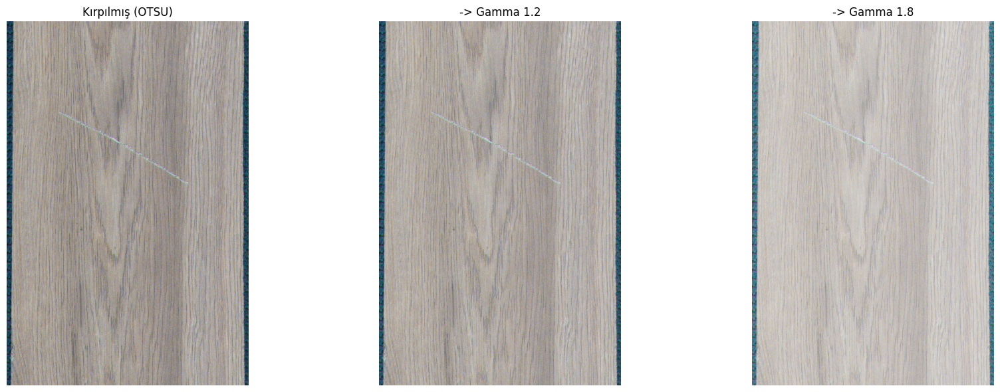

In [ ]:
# gamma12 = preprocessor.adjust_gamma(otsu_image, gamma=1.2)
# gamma18 = preprocessor.adjust_gamma(otsu_image, gamma=1.8)

# show_side_by_side(
#     [otsu_image, gamma12, gamma18],
#     ["Kırpılmış (OTSU)", "-> Gamma 1.2", "-> Gamma 1.8"]
# )


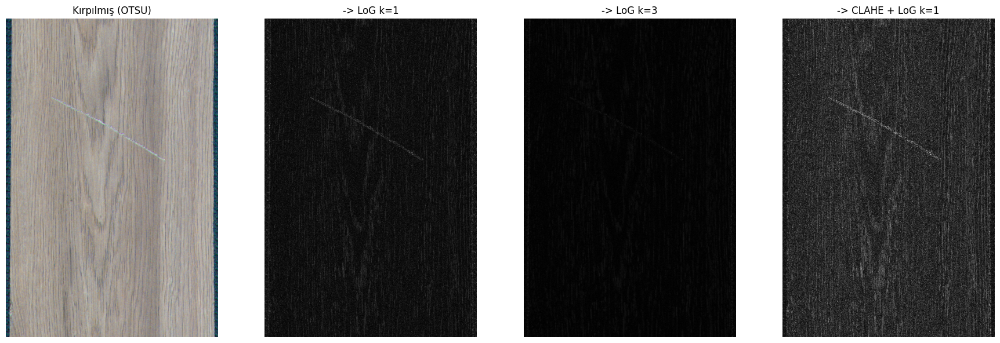

In [ ]:
# log1 = preprocessor.apply_log_filter(otsu_image, ksize=1)
# clahe_and_log1 = preprocessor.apply_log_filter(clahe_image, ksize=1)
# log3 = preprocessor.apply_log_filter(otsu_image, ksize=3)

# show_side_by_side(
#     [otsu_image, log1, log3, clahe_and_log1],
#     ["Kırpılmış (OTSU)", "-> LoG k=1", "-> LoG k=3", "-> CLAHE + LoG k=1"]
# )


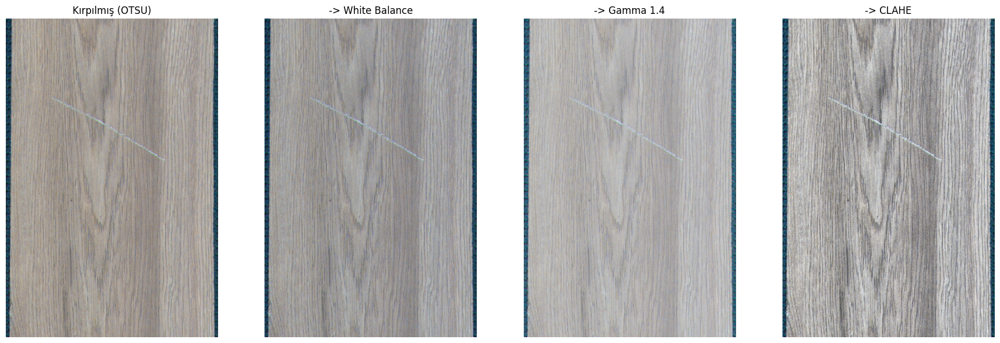

In [ ]:
# wb = preprocessor.white_balance(otsu_image)
# gamma = preprocessor.adjust_gamma(wb, gamma=1.4)
# clahe = preprocessor.enhance_contrast(gamma, method='clahe')

# show_side_by_side(
#     [otsu_image, wb, gamma, clahe],
#     ["Kırpılmış (OTSU)", "-> White Balance", "-> Gamma 1.4", "-> CLAHE"]
# )


In [ ]:
# sobel_img = preprocessor.apply_sobel(otsu_image)
# highboost_img = preprocessor.high_boost_filter(otsu_image, boost_factor=1.7)
# hsv_v_img = preprocessor.hsv_v_enhance(otsu_image)
# edgepres_img = preprocessor.edge_preserving(otsu_image)

# # Görselleştir
# show_side_by_side(
#     [otsu_image, sobel_img, highboost_img, hsv_v_img, edgepres_img],
#     ["Kırpılmış (OTSU)", "Sobel Edge", "High-Boost (1.7x)", "HSV-V Enhance", "Edge-Preserving"],
#     figsize=(20,6)
# )

Output hidden; open in https://colab.research.google.com to view.

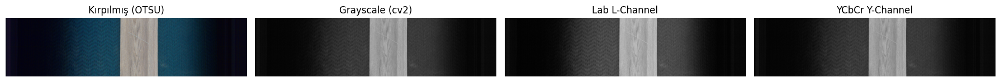

In [ ]:
# gray_basic = preprocessor.to_grayscale(original_image)
# gray_lab = preprocessor.to_lab_lightness(original_image)
# gray_ycbcr = preprocessor.to_ycbcr_luma(original_image)

# show_side_by_side(
#     [original_image, gray_basic, gray_lab, gray_ycbcr],
#     ["Kırpılmış (OTSU)", "Grayscale (cv2)", "Lab L-Channel", "YCbCr Y-Channel"],
#     figsize=(18,6)
# )


İyi gözüken ön işlemler :

- OTSU Kırpma
- HSV-V Enhance
- CLAHE

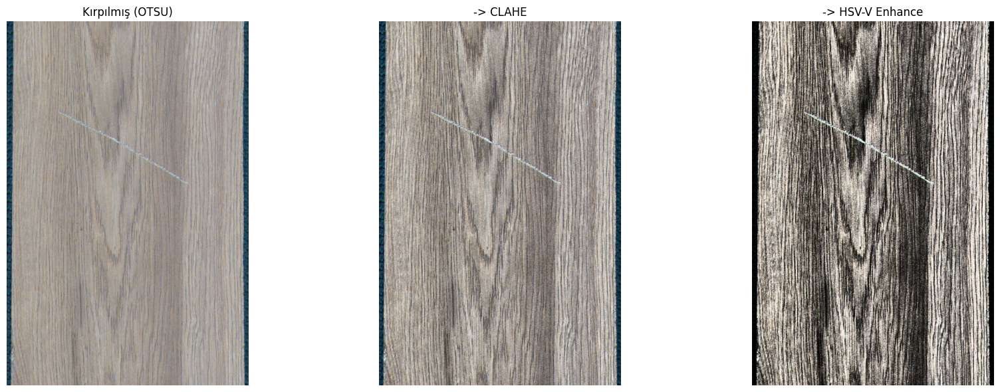

In [ ]:
# mix_1 = preprocessor.enhance_contrast(otsu_image, method='clahe')
# mix_2 = preprocessor.hsv_v_enhance(mix_1)

# show_side_by_side(
#     [otsu_image, mix_1, mix_2],
#     ["Kırpılmış (OTSU)", "-> CLAHE", "-> HSV-V Enhance"]
# )

## 5. Tüm Veri Setini İşle ve Kaydet

Şimdi tüm DataFrame'i satır satır gezip her bir görüntüyü işleyeceğiz ve sonuçları `PREPROCESSED_ROOT` ile belirtilen yeni klasör yapısına kaydedeceğiz.

In [16]:
from tqdm.auto import tqdm
tqdm.pandas()

def process_and_save(df, preprocessor, base_output_root, config, variant_name="default"):
    output_root = os.path.join(base_output_root, variant_name)
    print(f"\n📂 Yeni varyant: {variant_name}")
    print(f"Kaydedilecek dizin: {output_root}")

    if os.path.exists(output_root):
        print(f"⚠️  Var olan klasör siliniyor: {output_root}")
        shutil.rmtree(output_root)

    # Alt klasörleri (train/test + good/defect) oluştur
    for _, row in df.iterrows():
        out_dir = os.path.join(output_root, row['type'], row['label'])
        os.makedirs(out_dir, exist_ok=True)

    def apply_preprocessing(row):
        # 1) Yükle
        img = preprocessor.load_image(row['filepath'])
        if img is None:
            print(f"⚠️ Yüklenemedi: {row['filepath']}")
            return

        # 2) İşle
        proc = preprocessor.preprocess_pipeline(img, config)
        if proc is None or (hasattr(proc, "size") and proc.size == 0):
            print(f"⚠️ İşlenemedi: {row['filepath']}")
            return

        # 3) Kaydet
        out_path = os.path.join(output_root, row['type'], row['label'], row['filename'])
        ok = cv2.imwrite(out_path, cv2.cvtColor(proc, cv2.COLOR_RGB2BGR))
        if not ok:
            print(f"⚠️ Kaydedilemedi: {out_path}")

    print("🚀 Tüm veri seti işleniyor...\n")
    df.progress_apply(apply_preprocessing, axis=1)

    # Konfigürasyonu yaz
    cfg_path = os.path.join(output_root, "preprocessing_config.json")
    with open(cfg_path, "w") as f:
        json.dump(config, f, indent=4)

    print(f"\n✅ Bitti. Çıktı: {output_root}")
    print(f"⚙️  Konfigürasyon: {cfg_path}")
    return output_root


### 5.1 istenen işlemin verisetine uygulanması

Şimdi pipeline kullanarak tüm veri setini işleyip kaydedelim.

In [17]:
# Otsu kırpma + CLAHE varyantı
otsu_clahe_config = {
    'crop_method': 'otsu',   # Otsu kırpma uygula
    # 'contrast': 'clahe',     # CLAHE kontrast iyileştirme uygula
    'resize': True           # Görselleri aynı boyuta getir
}

# Yeni dataset varyantını üret
variant_name = "wood_otsu"
output_path = process_and_save(df, preprocessor, DATASET_ROOT, otsu_clahe_config, variant_name)



📂 Yeni varyant: wood_otsu
Kaydedilecek dizin: c:\Users\Yasin\Desktop\Kodlar\OGU\machine_learning\dataset\wood_otsu
🚀 Tüm veri seti işleniyor...



  0%|          | 0/136 [00:00<?, ?it/s]


✅ Bitti. Çıktı: c:\Users\Yasin\Desktop\Kodlar\OGU\machine_learning\dataset\wood_otsu
⚙️  Konfigürasyon: c:\Users\Yasin\Desktop\Kodlar\OGU\machine_learning\dataset\wood_otsu\preprocessing_config.json


### 5.2 Farklı birleşimlerin tüm datasete uygulanarak klasörlere kaydedilmesi

Farklı konfigürasyonlar deneyebiliriz. Zevkimize göre deneyelim :d
Ve biraz GPT'den yardım alalım :)

In [ ]:
# 1️⃣ Sade Otsu kırpma + CLAHE (temel sürüm)
otsu_clahe_config = {
    'crop_method': 'otsu',
    'contrast': 'clahe',
    'resize': True
}

# 2️⃣ CLAHE + White Balance (renk dengesi ile kontrast)
clahe_wb_config = {
    'crop_method': 'otsu',
    'white_balance': True,
    'contrast': 'clahe',
    'resize': True
}

# 3️⃣ CLAHE + Gamma Correction (aydınlatma düzeltme)
clahe_gamma_config = {
    'crop_method': 'otsu',
    'contrast': 'clahe',
    'gamma': 1.4,
    'resize': True
}

# 4️⃣ CLAHE + LoG (kenar ve detay vurgusu)
clahe_log_config = {
    'crop_method': 'otsu',
    'contrast': 'clahe',
    'apply_log': True,
    'resize': True
}

# 5️⃣ Sobel + CLAHE (yönlü kenar vurgusu)
sobel_clahe_config = {
    'crop_method': 'otsu',
    'contrast': 'clahe',
    'apply_sobel': True,
    'resize': True
}

# 🔧 Tüm varyantlar
variants = {
    "wood_otsu_clahe": otsu_clahe_config,
    "wood_otsu_clahe_wb": clahe_wb_config,
    "wood_otsu_clahe_gamma": clahe_gamma_config,
    "wood_otsu_clahe_log": clahe_log_config,
    "wood_otsu_sobel_clahe": sobel_clahe_config
}

# 🔁 Her varyantı sırayla çalıştır
for name, cfg in variants.items():
    print(f"\n{'='*70}")
    print(f"🧩 Varyant işleniyor: {name}")
    print(f"{'='*70}")
    process_and_save(df, preprocessor, "dataset", cfg, name)



## Sonuç

Bu notebook ile:
1. Veri setini yapısal bir DataFrame'e dönüştürdük.
2. Güçlü bir önişleme sınıfı tanımladık.
3. Önişlemenin etkisini görsel olarak test ettik.
4. Tüm veri setini seçtiğimiz konfigürasyon ile işleyip yeni bir klasöre kaydettik.

Artık model eğitimi için `dataset/wood_preprocessed_xyz` klasöründeki verileri kullanabilirsiniz.